In [179]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# import pickle

from sklearn.metrics import classification_report, confusion_matrix

In [2]:
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('png', 'pdf')
plt.rcParams.update({'font.size': 12,
                     'xtick.labelsize' : 12,
                     'ytick.labelsize' : 12,
                     'axes.grid': False})

In [177]:
def plot_confusion_mtx(cm: 'confusion matrix', labels = None, 
                       figsize = (3,3), binary = False, ax=None):
    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot()
    sns.heatmap(cm, annot = True, fmt = '0', annot_kws = {"fontsize": 16}, 
                cmap = "Blues", cbar = False, ax = ax)
    ax.set_xlabel('Predicted Class', fontsize = 14)
    ax.set_ylabel('Actual Class', fontsize = 14)
    if labels is None:
        labels = range(1, cm.shape[1] + 1)     
    ax.set_xticks(ax.get_xticks(), labels)
    ax.set_yticks(ax.get_yticks(), labels)
    if binary:
        ax.set_xticks([0.5,1.5], [r'+', r'$-$'], fontsize = 18)
        ax.set_yticks([0.5,1.5], [r'+', r'$-$'], fontsize = 18)
        ax.xaxis.tick_top()
        ax.xaxis.set_label_position('top')
    return ax

In [3]:
X_train = pd.read_fwf(".\X_train.txt", header = None)
X_test = pd.read_fwf(".\X_test.txt", header = None)
y_train = pd.read_fwf(".\y_train.txt", header = None)[0]
y_test = pd.read_fwf(".\y_test.txt", header = None)[0]

subject_train = pd.read_csv(".\subject_train.txt", header = None)[0]
subject_test = pd.read_csv(".\subject_test.txt", header = None)[0]

body_x = pd.read_fwf("./body_acc_x_train.txt", header = None)
body_y = pd.read_fwf("./body_acc_y_train.txt", header = None)
body_z = pd.read_fwf("./body_acc_z_train.txt", header = None)

gyro_x = pd.read_fwf("./body_gyro_x_train.txt", header = None)
gyro_y = pd.read_fwf("./body_gyro_y_train.txt", header = None)
gyro_z = pd.read_fwf("./body_gyro_z_train.txt", header = None)

body_x_test = pd.read_fwf("./body_acc_x_test.txt", header = None)
body_y_test = pd.read_fwf("./body_acc_y_test.txt", header = None)
body_z_test = pd.read_fwf("./body_acc_z_test.txt", header = None)

gyro_x_test = pd.read_fwf("./body_gyro_x_test.txt", header = None)
gyro_y_test = pd.read_fwf("./body_gyro_y_test.txt", header = None)
gyro_z_test = pd.read_fwf("./body_gyro_z_test.txt", header = None)

In [4]:
with open("features.txt") as f:
    lines = f.read().splitlines()
    
features = {}
for line in lines:
    idx, name = line.split()
    features[int(idx)-1] = name

In [5]:
with open('activity_labels.txt') as f:
    lines = f.read().splitlines()

activities = {}
for line in lines:
    label, activity = line.split()
    activities[int(label)] = activity

In [6]:
y_train_mapped = y_train.map(activities)
y_test_mapped = y_test.map(activities)

# Time series dataframe

In [7]:
subject_train.unique()

array([ 1,  3,  5,  6,  7,  8, 11, 14, 15, 16, 17, 19, 21, 22, 23, 25, 26,
       27, 28, 29, 30], dtype=int64)

Creiamo un dizionario con tutti e 6 i dataframe: body_x, body_y, body_z, gyro_x, gyro_y, gyro_z. Per ognuno di questi dataframe andiamo poi a prenderci solamente le prime 64 colonne (letture). Dobbiamo però considerare che, così facendo, le letture che vanno dalla 64esima alla 127esima colonna dell'ultima riga di ciascun dataframe verrebbero perse. Per tale motivo, prendiamo l'ultima riga per intero. Più precisamente, con le ultime 64 letture dell'ultima riga andiamo a crearci una nuova riga. Alla fine, ciascun dataset non avrà più 7352 righe, bensì 7353.

In [7]:
dict_dfs = {'body_x': body_x,
            'body_y': body_y,
            'body_z': body_z,
            'gyro_x': gyro_x,
            'gyro_y': gyro_y,
            'gyro_z': gyro_z}

for name_df, df in dict_dfs.items():
    last_row = df.iloc[-1:,64:]
    last_row.columns = np.arange(64) # rename columns of the last raw
    first64 = df.iloc[:,:64]
    dict_dfs[name_df] = pd.concat([first64, last_row], ignore_index=True)
    # aggiungiamo anche le colonne ID soggetto e tipo di attività svolta
    dict_dfs[name_df]['subject'] = subject_train
    dict_dfs[name_df]['activity'] = y_train_mapped
    dict_dfs[name_df].iloc[-1, -2:] = dict_dfs[name_df].iloc[-2, -2:]
    dict_dfs[name_df]['subject'] = dict_dfs[name_df]['subject'].astype(int)

In [8]:
dict_dfs['body_x']

,0,1,2,3,4,5,6,7,8,9,...,56,57,58,59,60,61,62,63,subject,activity
0,0.000181,0.010139,0.009276,0.005066,0.010810,0.004045,0.004757,0.006214,0.003307,0.007572,...,0.003447,0.004378,0.005006,0.001997,-0.000472,-0.000756,-0.001528,-0.002391,1,STANDING
1,0.001094,0.004550,0.002879,0.002247,0.003305,0.002416,0.001619,0.000981,0.000009,-0.000363,...,0.000060,0.000435,-0.000819,0.000228,-0.000300,-0.001147,-0.000222,0.001576,1,STANDING
2,0.003531,0.002285,-0.000420,-0.003738,-0.006706,-0.003148,0.000733,0.000668,0.002162,-0.000946,...,0.001333,0.001541,0.001077,-0.000736,-0.003767,-0.004646,-0.002941,-0.001599,1,STANDING
3,-0.001772,-0.001311,0.000388,0.000408,-0.000355,0.000998,0.001109,-0.003149,-0.008882,-0.010483,...,-0.000268,-0.000394,-0.000279,-0.000316,0.000144,0.001246,0.003117,0.002178,1,STANDING
4,0.000087,-0.000272,0.001022,0.003126,0.002284,0.000885,0.001933,0.002270,0.002247,0.002175,...,0.001358,0.000820,-0.000212,-0.001915,-0.001631,-0.000867,-0.001172,-0.000028,1,STANDING
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7348,0.711864,0.709237,0.321368,-0.028921,-0.208107,-0.192802,-0.066754,-0.042285,0.058089,0.106855,...,-0.227710,-0.210942,-0.179295,-0.142085,-0.131831,-0.154000,-0.176886,-0.211068,30,WALKING_UPSTAIRS
7349,-0.226717,-0.177817,-0.150869,-0.132237,-0.068338,0.007874,0.096481,0.205834,0.441342,0.662930,...,-0.274100,-0.326159,-0.379539,-0.382544,-0.371156,-0.295357,-0.203831,-0.124548,30,WALKING_UPSTAIRS
7350,-0.064806,-0.079933,-0.068350,-0.038477,-0.028679,0.018335,0.077571,0.253580,0.507805,0.583999,...,-0.313892,-0.367070,-0.395135,-0.347338,-0.319902,-0.294935,-0.243403,-0.215215,30,WALKING_UPSTAIRS
7351,-0.194471,-0.173802,-0.127545,-0.108369,-0.121152,-0.074004,-0.002135,0.177865,0.516936,0.701378,...,-0.396854,-0.413906,-0.379085,-0.356609,-0.317618,-0.315016,-0.330737,-0.272348,30,WALKING_UPSTAIRS


Partendo dai dataframe appena definiti, creiamo un dataset di time series come di seguito mostrato. Ciascuno dei 21 soggetti nel train set svolge 5 attività differenti, quindi per ogni colonna avremo $21\cdot5=105$ time series.

| index | body_x | body_y | body_z | gyro_x | gyro_y | gyro_z | subject | activity |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 0 | TS | TS | TS | TS | TS | TS | 1 | 'WALKING' |
| 1 | TS | TS | TS | TS | TS | TS | 1 | 'WALKING_UPSTAIRS' |
| ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 4 | TS | TS | TS | TS | TS | TS | 1 | 'STANDING' |
| 5 | TS | TS | TS | TS | TS | TS | 2 | 'WALKING' |
| 6 | TS | TS | TS | TS | TS | TS | 2 | 'WALKING_UPSTAIRS' |
| ... | ... | ... | ... | ... | ... | ... | ... | ... |
| 9 | TS | TS | TS | TS | TS | TS | 2 | 'STANDING' |
| ... | ... | ... | ... | ... | ... | ... | ... | ... |

Per costruire questa tabella, creiamo prima il dizionario associato

In [8]:
dict_dfs_ts = {name_df: [] for name_df in dict_dfs}
dict_dfs_ts['subject'] = []
dict_dfs_ts['activity'] = []
for name_df, df in dict_dfs.items():
    for subject in subject_train.unique():
        for activity in [activities[k] for k in range(1,6)]: 
            # non consideriamo LAYING
            mask = (df['activity'] == activity) & (df['subject'] == subject)
            time_series = df.iloc[mask.values, :-2].values.ravel()
            dict_dfs_ts[name_df].append(time_series)
            # all'ultima iterazione del lool più esterno ci salviamo anche
            # gli ID dei soggetti e le attività nell'ordine di comparizione
            if name_df == 'gyro_z':
                dict_dfs_ts['subject'].append(subject) 
                dict_dfs_ts['activity'].append(activity)

In [9]:
df_ts = pd.DataFrame(dict_dfs_ts)
df_ts

,body_x,body_y,body_z,gyro_x,gyro_y,gyro_z,subject,activity
0,"[0.3767984, 0.3820639, 0.119208, -0.2899142, -...","[-0.07615856, -0.09193956, 0.04778273, 0.15049...","[-0.01594575, -0.1020025, -0.05738191, -0.0663...","[-0.5624105, -0.5068743, -0.7771669, -1.317128...","[0.975277, 1.613873, 0.8407163, -0.317289, -0....","[0.2787811, 0.1157149, -0.1098379, 0.09024409,...",1,WALKING
1,"[-0.08881959, -0.1151428, -0.1522331, -0.16081...","[-0.05260389, -0.006149942, 0.04900373, 0.0617...","[0.1089787, 0.1146377, 0.1304551, 0.1548021, 0...","[0.379767, 0.3878029, 0.3784668, 0.3274898, 0....","[0.6916201, 0.7338988, 0.7673131, 0.6688538, 0...","[0.03231439, -0.02200011, -0.06834814, -0.0575...",1,WALKING_UPSTAIRS
2,"[-0.2155845, -0.207075, -0.1821384, -0.1427411...","[0.05320855, -0.01513074, -0.02538666, 0.01346...","[0.0178802, -0.02187651, -0.0008303998, -0.002...","[0.2202674, 0.3322385, 0.4420194, 0.4824141, 0...","[0.159655, 0.2812229, 0.3379647, 0.2390217, 0....","[0.01094215, 0.02547416, 0.01092202, 0.0177640...",1,WALKING_DOWNSTAIRS
3,"[-0.08885533, -0.08666822, -0.08796819, -0.085...","[0.3491606, 0.3527503, 0.3613176, 0.3744291, 0...","[0.2920406, 0.2845418, 0.2828897, 0.2825882, 0...","[0.05853499, 0.06523332, 0.07282671, 0.0639263...","[0.03468009, 0.0124743, -0.03566388, -0.057899...","[-0.1154221, -0.1179507, -0.1149668, -0.109188...",1,SITTING
4,"[0.0001808515, 0.01013856, 0.009275574, 0.0050...","[0.01076681, 0.00657948, 0.008928878, 0.007488...","[0.05556068, 0.05512483, 0.04840473, 0.0497749...","[0.03019122, 0.04371071, 0.0356878, 0.0404021,...","[0.06601362, 0.04269897, 0.07485018, 0.0573197...","[0.02285864, 0.01031572, 0.01324969, 0.0177512...",1,STANDING
...,...,...,...,...,...,...,...,...
100,"[-0.2056145, -0.2610236, -0.2721646, -0.272464...","[-0.04162483, -0.02775267, -0.03574828, -0.035...","[0.1334201, 0.1435552, 0.143089, 0.1610788, 0....","[0.1002978, 0.03116869, -0.00367747, 0.0266553...","[0.8548481, 0.7195973, 0.5228794, 0.1387529, -...","[-0.02994659, 0.02322512, 0.1121064, 0.1520975...",30,WALKING
101,"[0.008258519, 0.0110812, 0.01652231, 0.0251404...","[0.2786442, 0.2649979, 0.2716955, 0.2599178, 0...","[0.07746708, 0.07492045, 0.0580958, 0.03495829...","[0.664576, 0.6032189, 0.52785, 0.5136015, 0.51...","[-0.3807465, -0.3433203, -0.3201531, -0.297911...","[-0.01962658, 0.03492375, 0.1534728, 0.2371735...",30,WALKING_UPSTAIRS
102,"[-0.09224173, -0.1235183, -0.1432697, -0.15384...","[0.1817281, 0.1391338, 0.08407567, 0.08017544,...","[-0.06889384, -0.04270107, -0.01054449, 0.0086...","[-0.287722, -0.3286186, -0.2297837, -0.1488549...","[0.3856957, 0.4106893, 0.3869054, 0.308527, 0....","[0.04400377, 0.07412732, 0.07090996, 0.0386945...",30,WALKING_DOWNSTAIRS
103,"[-0.03565454, -0.03324404, -0.0297281, -0.0297...","[0.1387171, 0.1366379, 0.1317901, 0.127761, 0....","[0.1693367, 0.1664923, 0.1580989, 0.1589778, 0...","[0.01904884, 0.02136498, 0.02647005, 0.0216551...","[0.06446733, 0.05345038, 0.03948838, 0.0257987...","[-0.01691631, 0.002576102, 0.01372988, 0.01367...",30,SITTING


In [11]:
# with open('df_ts.pkl', 'wb') as f:
#         pickle.dump(df_ts, f)

In [12]:
# with open('df_ts.pkl', 'rb') as f:
#     df_ts = pickle.load(f)

Facciamo la stessa cosa per il test set

In [10]:
dict_dfs_test = {'body_x': body_x_test,
                 'body_y': body_y_test,
                 'body_z': body_z_test,
                 'gyro_x': gyro_x_test,
                 'gyro_y': gyro_y_test,
                 'gyro_z': gyro_z_test}

for name_df, df in dict_dfs_test.items():
    last_row = df.iloc[-1:,64:]
    last_row.columns = np.arange(64) # rename columns of the last raw
    first64 = df.iloc[:,:64]
    dict_dfs_test[name_df] = pd.concat([first64, last_row], ignore_index=True)
    # aggiungiamo anche le colonne ID soggetto e tipo di attività svolta
    dict_dfs_test[name_df]['subject'] = subject_test
    dict_dfs_test[name_df]['activity'] = y_train_mapped
    dict_dfs_test[name_df].iloc[-1, -2:] = dict_dfs_test[name_df].iloc[-2, -2:]
    dict_dfs_test[name_df]['subject'] = dict_dfs_test[name_df]['subject'].astype(int)
    
dict_dfs_ts_test = {name_df: [] for name_df in dict_dfs_test}
dict_dfs_ts_test['subject'] = []
dict_dfs_ts_test['activity'] = []
for name_df, df in dict_dfs_test.items():
    for subject in subject_test.unique():
        for activity in [activities[k] for k in range(1,6)]: 
            # non consideriamo LAYING
            mask = (df['activity'] == activity) & (df['subject'] == subject)
            time_series = df.iloc[mask.values, :-2].values.ravel()
            dict_dfs_ts_test[name_df].append(time_series)
            # all'ultima iterazione del lool più esterno ci salviamo anche
            # gli ID dei soggetti e le attività nell'ordine di comparizione
            if name_df == 'gyro_z':
                dict_dfs_ts_test['subject'].append(subject) 
                dict_dfs_ts_test['activity'].append(activity)
                
df_ts_test = pd.DataFrame(dict_dfs_ts_test)
print(df_ts_test.shape)
df_ts_test

(45, 8)


,body_x,body_y,body_z,gyro_x,gyro_y,gyro_z,subject,activity
0,"[0.01320046, 0.01682231, 0.01730045, 0.0175455...","[0.001973605, 0.002142463, 0.0006273488, -0.00...","[-0.005482074, -0.00308659, -0.006719487, -0.0...","[0.005753219, -0.0001820775, 0.001591174, 0.00...","[-0.002114665, 0.003559954, -0.004588763, -0.0...","[0.005463871, 0.00310208, 0.0120293, 0.0189687...",2,WALKING
1,"[0.2355948, 0.2466111, 0.3320341, 0.4892892, 0...","[0.0639848, 0.1778715, 0.2819124, 0.1089424, -...","[-0.08134841, -0.2149337, -0.4103081, -0.50053...","[-0.5387907, -0.653328, -0.8343902, -0.9199241...","[-0.1659502, -0.3089407, -0.3500776, -0.149157...","[0.3151212, 0.270872, 0.2754882, 0.3155492, 0....",2,WALKING_UPSTAIRS
2,"[-0.3647585, -0.2144658, -0.08926171, -0.05636...","[0.09769928, 0.1046928, 0.1248889, 0.09018532,...","[0.1576034, 0.1082334, -0.02039238, -0.1408169...","[0.9628825, 1.160488, 1.114248, 1.106795, 1.17...","[-0.2683167, -0.132044, -0.2509737, -0.1331634...","[0.3621032, 0.3398063, 0.3895613, 0.3614678, 0...",2,WALKING_DOWNSTAIRS
3,"[-0.0002071833, -0.001206737, -0.003566287, -0...","[-0.006730327, -0.007660402, -0.007356134, -0....","[-0.01199027, -0.009782071, -0.01030756, -0.00...","[-0.01109365, -0.01698659, -0.01545217, -0.008...","[0.0008346684, -0.0005569567, -0.003684011, -0...","[0.01736456, 0.01546254, 0.01222174, 0.0079424...",2,SITTING
4,"[0.01165315, 0.01310909, 0.01126885, 0.0278307...","[-0.02939904, -0.03972867, -0.05240586, -0.052...","[0.1068262, 0.1524549, 0.2168462, 0.2025812, 0...","[0.4374637, 0.4682641, 0.4982574, 0.4793957, 0...","[0.5313492, 0.7210685, 0.5203284, 0.3726252, 0...","[0.1365279, 0.09762239, 0.08355578, 0.02286101...",2,STANDING
5,"[-0.2959089, -0.3019473, -0.2747423, -0.133472...","[-0.04083863, -0.06869917, -0.06110585, -0.006...","[-0.03907299, -0.01896556, -0.01816537, 0.0433...","[-0.7091551, -0.6308298, -0.6182338, -0.638109...","[-0.04852962, -0.04435917, -0.1141435, -0.1184...","[-0.3740465, -0.2764384, -0.2492035, -0.287109...",4,WALKING
6,"[-0.03333633, -0.0278014, -0.03130994, -0.0323...","[-0.005487181, -0.01608266, -0.01310954, -0.01...","[0.1577464, 0.1446182, 0.1367732, 0.1425561, 0...","[0.3123978, 0.2893629, 0.2172125, 0.1820482, 0...","[-0.07694187, 0.02858839, 0.1431223, 0.1918901...","[0.09411999, 0.1012118, 0.09652262, 0.03523908...",4,WALKING_UPSTAIRS
7,"[0.06131741, -0.03474145, -0.004498172, -0.066...","[0.1481802, 0.1777282, 0.1631908, 0.1945173, 0...","[0.2305937, 0.2443892, 0.2443483, 0.295758, 0....","[0.2680972, 0.2777525, 0.3003549, 0.2494988, 0...","[0.5342797, 0.5550544, 0.5073191, 0.396355, 0....","[0.2333362, 0.1199425, -0.06049969, -0.0538872...",4,WALKING_DOWNSTAIRS
8,"[2.888947e-05, 0.000308628, 0.002819689, 0.003...","[0.001418952, 0.005791899, 0.004484958, -0.002...","[0.002009836, 0.000820616, 0.0009974379, 0.000...","[-0.004608269, -0.004471681, -0.006183751, -0....","[0.01378143, 0.01011677, 0.01666623, 0.0216412...","[0.0003082036, -0.00278005, -0.00245328, -0.00...",4,SITTING
9,"[0.007631353, 0.004476353, 0.004889581, -0.002...","[-0.01715974, -0.01862566, -0.01180089, -0.003...","[0.006802585, -0.002106795, -0.004933527, -0.0...","[0.03890467, 0.03787865, 0.03630532, 0.0357058...","[-0.0471093, -0.01916139, -0.005840808, 0.0138...","[0.01624974, -0.003543099, -0.008401148, -0.01...",4,STANDING


In [84]:
# with open('df_ts_test.pkl', 'wb') as f:
#         pickle.dump(df_ts_test, f)

Proviamo a plottare tutte le TS del record 0 (soggetto 1, attività `WALKING`))

In [12]:
 df_ts.columns

Index(['body_x', 'body_y', 'body_z', 'gyro_x', 'gyro_y', 'gyro_z', 'subject',
       'activity'],
      dtype='object')

In [95]:
str(df_ts.iloc[record_idx, -2:].values)

"[30 'WALKING_DOWNSTAIRS']"

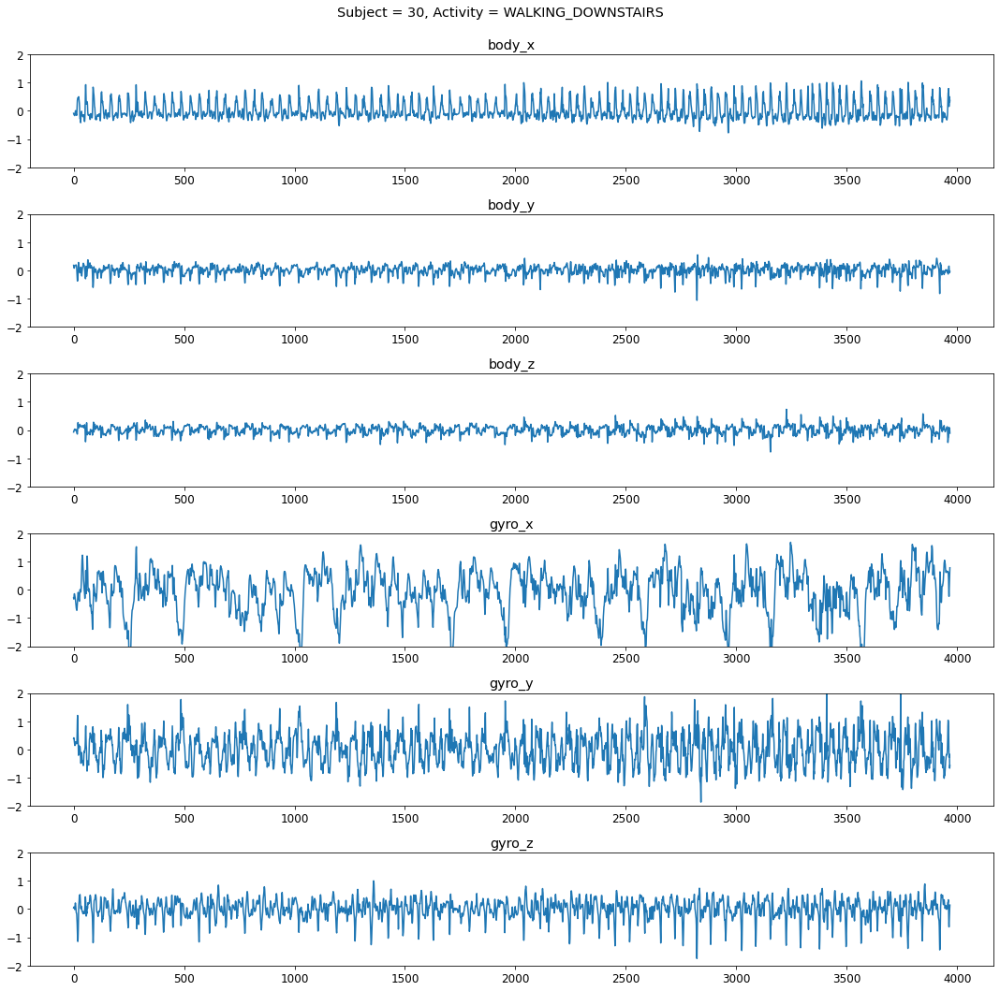

In [11]:
plt.figure(figsize=(15,15), tight_layout=True)
record_idx = 102
subj_id, act = df_ts.iloc[record_idx, -2:].values
plt.suptitle(f'Subject = {subj_id}, Activity = {act}\n')
for i, TS in enumerate(df_ts.iloc[record_idx, :-2], 1):
    plt.subplot(6,1,i)
    plt.plot(TS)
    title = df_ts.columns[i-1]
    plt.title(title)
    plt.ylim(-2,2)
plt.show()

In [100]:
# test set 

# plt.figure(figsize=(15,15), tight_layout=True)
# for i, TS in enumerate(df_ts.iloc[0, :-2], 1):
#     plt.subplot(6,1,i)
#     plt.plot(TS)
#     title = df_ts.columns[i-1]
#     plt.title(title)
#     plt.ylim(-2,2)
# plt.show()

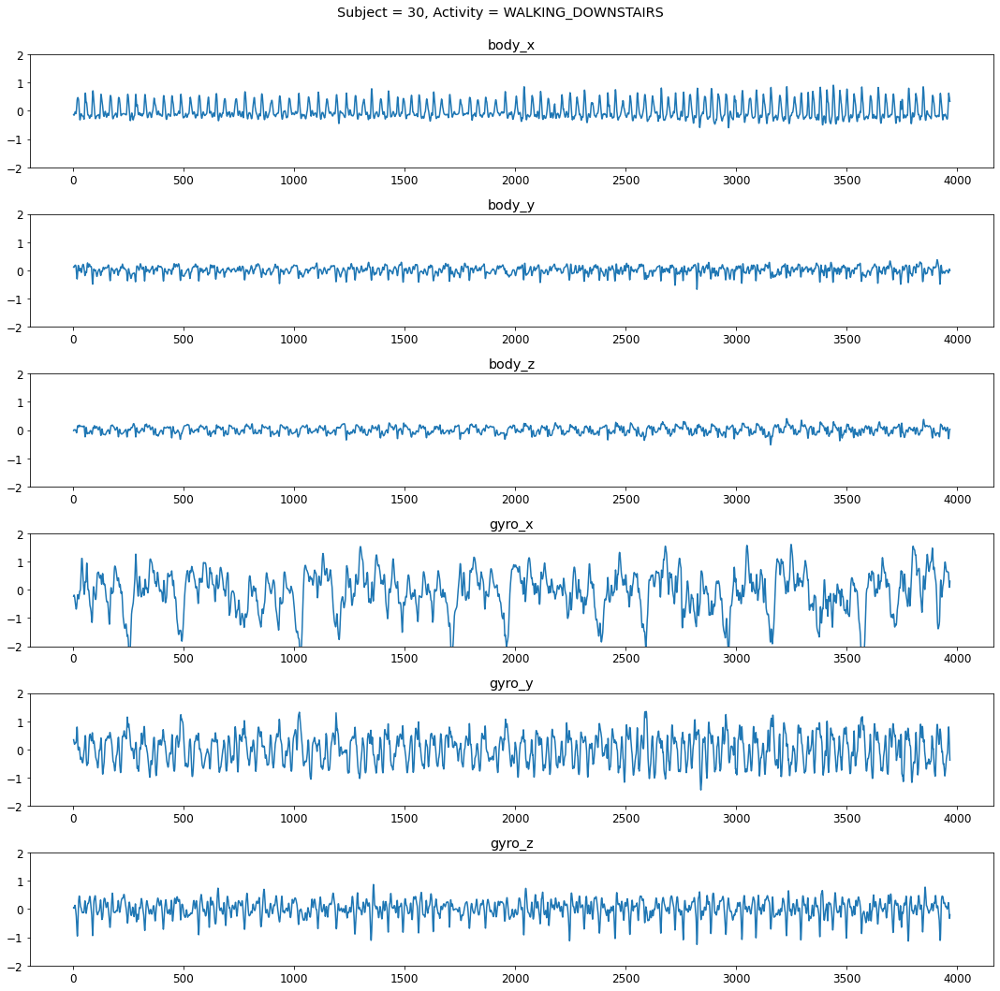

In [12]:
# media mobile 

plt.figure(figsize=(15,15), tight_layout=True)
window = 5
record_idx = 102
subj_id, act = df_ts.iloc[record_idx, -2:].values
plt.suptitle(f'Subject = {subj_id}, Activity = {act}\n')
for i, TS in enumerate(df_ts.iloc[record_idx, :-2], 1):
    plt.subplot(6,1,i)
    plt.plot(pd.Series(TS).rolling(window).mean()[window-1:])
    title = df_ts.columns[i-1]
    plt.title(title)
    plt.ylim(-2,2)
plt.show()

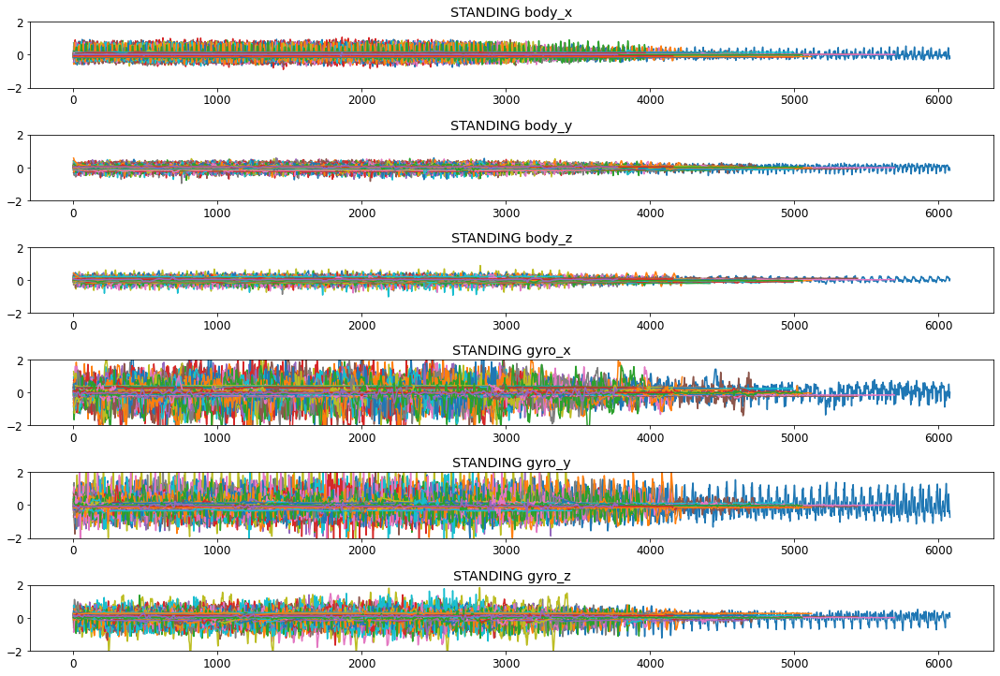

In [102]:
plt.figure(figsize=(15,50), tight_layout=True)
windows = 5
for act in [activities[k] for k in range(1,6)]:
    mask = df_ts['activity'] == act
    for i, col in enumerate(df_ts.columns[:-2], 1):
        plt.subplot(30,1,i)
        plt.title(act + ' ' + col)
        for ts in df_ts.loc[mask, col].values:           
            plt.plot(pd.Series(ts - ts.mean()/ts.std()).rolling(windows).mean()[windows-1:])
        plt.ylim(-2,2)
plt.show()

In [73]:
mask = df_ts['activity'] == 'WALKING'
ts_body_x = df_ts.loc[mask,'body_x'].values

In [97]:
from itertools import combinations
from tslearn.metrics import dtw, dtw_path, cdist_dtw, subsequence_cost_matrix

In [75]:
len(list(combinations(ts_body_x, 2)))

210

In [76]:
summation = 0
for ts1, ts2 in combinations(ts_body_x, 2):
    dtw_dist = dtw(ts1, ts2)
    summation += dtw_dist
summation/210

6.0943825218637295

---

facciamo una classificazione utilizzando i sia i dataset con 128 timestamp sia quelli con 64 per vedere se ci sono differenzein termini di accuracy

In [330]:
from pyts.classification import KNeighborsClassifier

In [331]:
dict_dfs['body_x'].values[:,:-2].shape

(7353, 64)

In [344]:
clf = KNeighborsClassifier(p=2, n_jobs=-1)
clf.fit(dict_dfs['body_x'].values[:-1,:-2], y_train.values)

y_pred = clf.predict(dict_dfs_test['body_x'].values[:-1,:-2])

print(classification_report(y_test.values, y_pred))

              precision    recall  f1-score   support

           1       0.77      0.94      0.84       496
           2       0.71      0.72      0.72       471
           3       0.93      0.66      0.78       420
           4       0.38      0.44      0.41       491
           5       0.41      0.40      0.40       532
           6       0.54      0.49      0.51       537

    accuracy                           0.60      2947
   macro avg       0.62      0.61      0.61      2947
weighted avg       0.61      0.60      0.60      2947



<AxesSubplot:xlabel='Predicted Class', ylabel='Actual Class'>

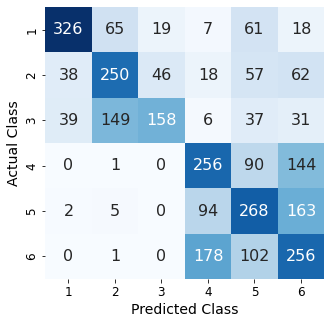

In [336]:
plot_confusion_mtx(confusion_matrix(y_test, y_pred), figsize=(5,5))

In [339]:
body_x.shape

(7352, 128)

In [345]:
clf = KNeighborsClassifier(p=2, n_jobs=-1)#metric='dtw_sakoechiba'
clf.fit(body_x.values, y_train.values)

y_pred = clf.predict(body_x_test.values)

print(classification_report(y_test.values, y_pred))

              precision    recall  f1-score   support

           1       0.77      0.93      0.84       496
           2       0.69      0.73      0.71       471
           3       0.91      0.61      0.73       420
           4       0.35      0.39      0.37       491
           5       0.43      0.46      0.44       532
           6       0.60      0.50      0.54       537

    accuracy                           0.60      2947
   macro avg       0.62      0.60      0.61      2947
weighted avg       0.61      0.60      0.60      2947



Le performance sono identiche, inoltre stranamente con time series di 128 timestamp l'algoritmo di classificazione è più veloce

In [357]:
clf = KNeighborsClassifier(p=2, n_jobs=-1)
%timeit clf.fit(body_x.values, y_train.values)

827 µs ± 1.38 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [350]:
body_x_ = dict_dfs['body_x'].values[:-1,:-2]
clf = KNeighborsClassifier(p=2, n_jobs=-1)
%timeit clf.fit(body_x_, y_train.values)

9.36 ms ± 143 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [19]:
# 128 timestamps

clf = KNeighborsClassifier(n_neighbors=3, metric='dtw_sakoechiba', 
                           metric_params={'window_size':0.01},  n_jobs=-1)
clf.fit(body_x.values, y_train.values)

y_pred = clf.predict(body_x_test.values)

print(classification_report(y_test.values, y_pred))

              precision    recall  f1-score   support

           1       0.83      0.98      0.90       496
           2       0.74      0.80      0.77       471
           3       0.96      0.66      0.78       420
           4       0.38      0.47      0.42       491
           5       0.45      0.48      0.46       532
           6       0.72      0.51      0.60       537

    accuracy                           0.64      2947
   macro avg       0.68      0.65      0.65      2947
weighted avg       0.67      0.64      0.65      2947



In [358]:
# 64 timestamps

clf = KNeighborsClassifier(n_neighbors=3, metric='dtw_sakoechiba', 
                           metric_params={'window_size':0.01},  n_jobs=-1)
clf.fit(body_x_, y_train.values)

y_pred = clf.predict(dict_dfs_test['body_x'].values[:-1,:-2])

print(classification_report(y_test.values, y_pred))

              precision    recall  f1-score   support

           1       0.78      0.96      0.87       496
           2       0.76      0.77      0.76       471
           3       0.96      0.68      0.80       420
           4       0.37      0.49      0.42       491
           5       0.44      0.39      0.42       532
           6       0.63      0.50      0.56       537

    accuracy                           0.63      2947
   macro avg       0.66      0.63      0.64      2947
weighted avg       0.64      0.63      0.63      2947



---

La libreria `tslearn` permette di lavorare con i dataset di time series con lunghezze differenti. Proviamo a vedere quindi le performance di classificazione utilizzando il dataset di time series che ci siamo costruiti in precedenza, i.e.:

In [314]:
df_ts.head(0)

,body_x,body_y,body_z,gyro_x,gyro_y,gyro_z,subject,activity


Potremmo utilizzare tutte le colonne, ma concentriamoci solo su `body_x`

In [70]:
from tslearn.utils import to_time_series_dataset
from tslearn.neighbors import KNeighborsTimeSeriesClassifier as KNN

trasformiamo i valori della variabile target in `int`

In [56]:
activities_inv_map = {v:k for k,v in activities.items()}
activities_inv_map

{'WALKING': 1,
 'WALKING_UPSTAIRS': 2,
 'WALKING_DOWNSTAIRS': 3,
 'SITTING': 4,
 'STANDING': 5,
 'LAYING': 6}

In [74]:
y_train_ts = [activities_inv_map[act] for act in dict_dfs_ts['activity']]
y_train_ts = np.array(y_train_ts)
y_test_ts = [activities_inv_map[act] for act in dict_dfs_ts_test['activity']]
y_test_ts = np.array(y_test_ts)

Rendiamo il dataset idoneo a lavorare con l'algoritmo di clustering utilizzando la funzione `to_time_series_dataset`. Sostanzialmente rende le time series della stessa lunghezza di quella più lunga andando ad aggiungere alla fine dell'array di ciascuna di esse tanti `nan`. Inoltre trasforma il dataset in 3 dimensioni.

In [ ]:
X_train_ts = to_time_series_dataset(dict_dfs_ts['body_x'])
X_test_ts = to_time_series_dataset(dict_dfs_ts_test['body_x'])

In [75]:
X_train_ts.shape

(105, 6080, 1)

In [92]:
knn = KNN(n_neighbors=3, metric = 'dtw', n_jobs = -1)
knn.fit(X_train_ts, y_train_ts)
y_pred = knn.predict(X_test_ts)

In [93]:
print(classification_report(y_test_ts, y_pred))

              precision    recall  f1-score   support

           1       0.29      0.22      0.25         9
           2       0.19      0.33      0.24         9
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         9
           5       0.17      0.33      0.22         9

    accuracy                           0.18        45
   macro avg       0.13      0.18      0.14        45
weighted avg       0.13      0.18      0.14        45



C:\Users\simon\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\simon\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\simon\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Visto che le performance non sono buone evitiamo di utilizzare anche le altre colonne

---

Proviamo a ripetere quanto appena fatto utilizzando però le time series approssimate con PAA. Anzicché specificare la lunghezza della finestra, con la libreria `pyts` possiamo specificare la lunghezza che dovrà avere l'output. L'algoritmo quindi adatterà la lunghezza della finestra in base a quella della time series.

In [98]:
from pyts.approximation import PiecewiseAggregateApproximation as PAA

In [324]:
X_body_x_paa = []
X_body_x_paa_test = []
body_x_mtx = [list(arr) for arr in dict_dfs_ts['body_x']]
body_x_mtx_test = [list(arr) for arr in dict_dfs_ts_test['body_x']]
for arr in body_x_mtx:
    paa = PAA(window_size=None, output_size=1000)
    X_body_x_paa.append(paa.transform([arr]))
for arr in body_x_mtx_test:
    paa = PAA(window_size=None, output_size=1000)
    X_body_x_paa_test.append(paa.transform([arr]))    

In [325]:
X_body_x_paa = np.array([np.squeeze(arr) for arr in X_body_x_paa])
X_body_x_paa_test = np.array([np.squeeze(arr) for arr in X_body_x_paa_test])
X_body_x_paa.shape, X_body_x_paa_test.shape

((105, 1000), (45, 1000))

In [326]:
knn = KNN(n_neighbors=1, metric = 'dtw', n_jobs = -1)
knn.fit(X_body_x_paa, y_train_ts)
y_pred = knn.predict(X_body_x_paa_test)

In [327]:
print(classification_report(y_test_ts, y_pred))

              precision    recall  f1-score   support

           1       0.18      0.22      0.20         9
           2       0.15      0.22      0.18         9
           3       0.00      0.00      0.00         9
           4       0.12      0.11      0.12         9
           5       0.23      0.33      0.27         9

    accuracy                           0.18        45
   macro avg       0.14      0.18      0.15        45
weighted avg       0.14      0.18      0.15        45



C:\Users\simon\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\simon\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\simon\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<AxesSubplot:xlabel='Predicted Class', ylabel='Actual Class'>

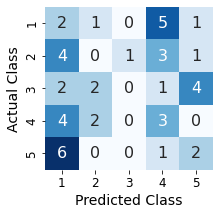

In [319]:
cm = confusion_matrix(y_test_ts, y_pred)
plot_confusion_mtx(cm)

Queste prestazioni sono state ottenute utilizzando riducendo le time series a 1000 timestamp, tuttavia anche aumentando o riducendo la dimensione degli array le prestazioni non cambiano in modo significativo

In [225]:
knn = KNN(n_neighbors=1, metric = 'euclidean', n_jobs = -1)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

In [226]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.97      0.69      0.81       496
           2       0.96      0.68      0.79       471
           3       0.98      0.28      0.43       420
           4       0.51      0.76      0.61       491
           5       0.49      0.64      0.55       532
           6       0.52      0.69      0.59       537

    accuracy                           0.63      2947
   macro avg       0.74      0.62      0.63      2947
weighted avg       0.72      0.63      0.63      2947



<AxesSubplot:xlabel='Predicted Class', ylabel='Actual Class'>

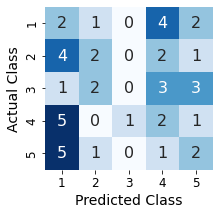

In [227]:
plot_confusion_mtx(cm)